In [178]:
import pandas as pd
#Loading of the labeled data
BLE_RSSI = pd.read_csv('iBeacon_RSSI_Labeled.csv') #Labeled dataset
locations = BLE_RSSI['location'][:] #The output variable, location, isolated from labled dataframe
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing

In [179]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
import math
X = data
y = locations

#Deviding data into train, validate and test
#X_train1, X_test, y_train1, y_test indicates only train and test data groups
X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size = 0.2, random_state =1017)
#X_test, y_test,X_train, X_val, y_train,y_val indicates train, validation and test dat groups
#X_train, X_val, y_train,y_val = train_test_split(X_train1, y_train1, test_size=0.18, random_state=6296)

def distance(test,pred):
    dist=0
    for a,b in zip(test,pred):
        
        x1=ord(a[0])-ord('A')
        x2=ord(b[0])-ord('A')
        y1=int(a[1:])
        y2=int(b[1:])
        dist+=math.sqrt((x1-x2)**2+(y1-y2)**2)
    dist=dist/len(test)
    return dist
model_dt = DecisionTreeClassifier()
model_dt.fit(X_train, y_train)
print('Decision tree model score (Default): ', model_dt.score(X_test, y_test))
y_pred=model_dt.predict(X_test)
print(classification_report(y_test, y_pred, digits=3))
print('mean error distance:',distance(y_test, y_pred))


Decision tree model score (Default):  0.3274647887323944
             precision    recall  f1-score   support

        D13      0.667     1.000     0.800         4
        D14      0.000     0.000     0.000         1
        D15      0.667     0.800     0.727         5
        E15      0.000     0.000     0.000         2
        G15      0.333     1.000     0.500         1
        I01      0.250     0.500     0.333         4
        I02      0.000     0.000     0.000         4
        I03      0.333     0.333     0.333         3
        I04      0.000     0.000     0.000         3
        I05      0.000     0.000     0.000         2
        I06      0.714     0.714     0.714         7
        I07      0.429     1.000     0.600         3
        I08      0.200     0.500     0.286         2
        I09      1.000     1.000     1.000         1
        I10      1.000     1.000     1.000         2
        I15      1.000     0.667     0.800         3
        J01      0.000     0.000     0.00

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


In [221]:
from sklearn.svm import SVC
svm_clf = SVC(kernel='linear')
svm_clf.fit(X_train, y_train)
y_pred = svm_clf.predict(X_test)
print('svm model score : ', svm_clf.score(X_test, y_test))
print(classification_report(y_test, y_pred, digits=3))
print('mean error distance:',distance(y_test, y_pred))


svm model score :  0.2887323943661972
             precision    recall  f1-score   support

        D13      0.750     0.750     0.750         4
        D14      0.000     0.000     0.000         1
        D15      0.625     1.000     0.769         5
        E15      0.000     0.000     0.000         2
        G15      0.500     1.000     0.667         1
        I01      0.167     0.250     0.200         4
        I02      0.000     0.000     0.000         4
        I03      1.000     0.333     0.500         3
        I04      0.000     0.000     0.000         3
        I05      0.000     0.000     0.000         2
        I06      0.455     0.714     0.556         7
        I07      0.333     0.667     0.444         3
        I08      0.667     1.000     0.800         2
        I09      0.500     1.000     0.667         1
        I10      1.000     1.000     1.000         2
        I15      0.000     0.000     0.000         3
        J01      0.000     0.000     0.000         2
       

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


In [182]:
from sklearn.ensemble import RandomForestClassifier
model_rf = RandomForestClassifier()
model_rf.fit(X_train, y_train)
y_pred = model_rf.predict(X_test)
print('model score : ', model_rf.score(X_test, y_test))
print(classification_report(y_test, y_pred, digits=3))
print('mean error distance:',distance(y_test, y_pred))


model score :  0.2887323943661972
             precision    recall  f1-score   support

        D13      0.500     0.250     0.333         4
        D14      0.000     0.000     0.000         1
        D15      1.000     0.800     0.889         5
        E15      0.333     1.000     0.500         2
        G15      0.500     1.000     0.667         1
        I01      0.250     0.500     0.333         4
        I02      0.000     0.000     0.000         4
        I03      0.333     0.333     0.333         3
        I04      0.000     0.000     0.000         3
        I05      0.000     0.000     0.000         2
        I06      1.000     0.714     0.833         7
        I07      0.333     0.333     0.333         3
        I08      0.667     1.000     0.800         2
        I09      1.000     1.000     1.000         1
        I10      1.000     1.000     1.000         2
        I15      0.000     0.000     0.000         3
        J01      0.000     0.000     0.000         2
        J02

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


10


773.2005071912762
Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


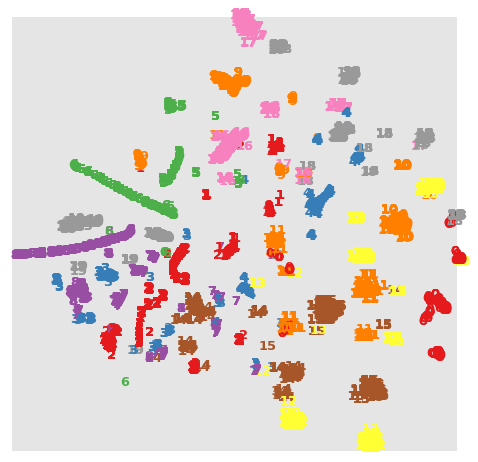

In [165]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import manifold
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
#Loading of the unlabeled data
BLE_RSSI = pd.read_csv('iBeacon_RSSI_Labeled.csv') #Labeled dataset
locations = BLE_RSSI['location'][:] #The output variable, location, isolated from labled dataframe
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
clf = KMeans(n_clusters=20,max_iter=1000)
y_predict=clf.fit_predict(data)
cents = clf.cluster_centers_#质心
labels = clf.labels_#样本点被分配到的簇的索引


tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 20.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


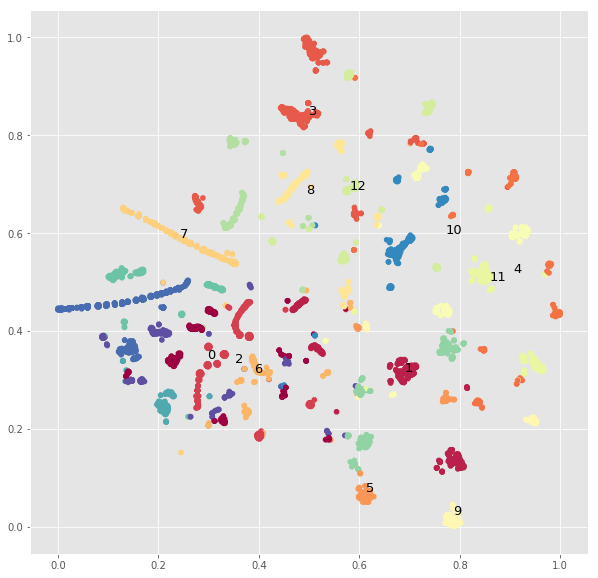

In [156]:
plt.figure(figsize=(10, 10))
plt.scatter(X_norm[:, 0], X_norm[:, 1], c=y_predict, cmap=plt.cm.Spectral, marker='8', linewidth=0)  
color=['r', 'b','g','r','orange']
for index in range(13):
    i=np.where(y_predict == index)
    dot = X_norm[i,:]
    xtext, ytext = np.median(dot[0,] ,axis=0)    #中心点
    #plt.scatter(dot[:,:, 0], dot[:,:,1],  s=40, marker='8', linewidth=0)  
    plt.text(xtext, ytext, str(index),  fontsize=13)




/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


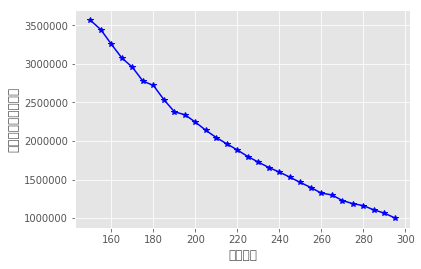

In [146]:
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
K = range(150,300,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    kmeans = KMeans(n_clusters=k,max_iter=1000)
    kmeans.fit_predict(data)
    # 返回簇标签
    labels = kmeans.labels_
    score1=calinski_harabaz_score(data, labels)
    # 返回簇中心
    centers = kmeans.cluster_centers_
    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(labels):
        SSE.append(np.sum((data.loc[labels == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)

# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, TSSE, 'b*-')
plt.xlabel('cluster')
plt.ylabel('SSE')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


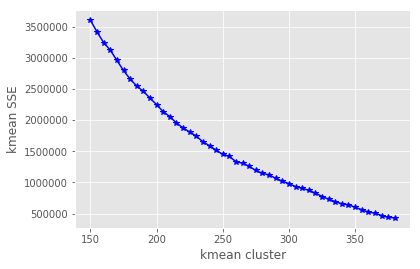

In [154]:
plt.plot(K, TSSE, 'b*-')
plt.xlabel('kmean cluster')
plt.ylabel('kmean SSE')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


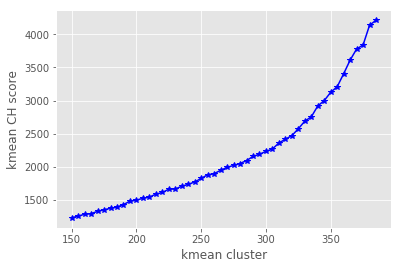

In [173]:

from sklearn.metrics import silhouette_score
K = range(150,390,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    kmeans = KMeans(n_clusters=k,max_iter=1000)
    kmeans.fit_predict(data)
    # 返回簇标签
    labels = kmeans.labels_
    score1=calinski_harabaz_score(data, labels)
    
    
    sc_score = silhouette_score(data, kmeans.labels_, metric='euclidean')
   

    centers = kmeans.cluster_centers_
    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(labels):
        SSE.append(np.sum((data.loc[labels == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, score, 'b*-')
plt.xlabel('kmean cluster')
plt.ylabel('kmean CH score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


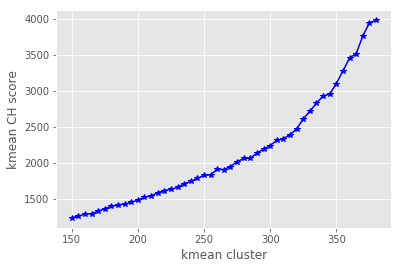

In [153]:
plt.plot(K, score, 'b*-')
plt.xlabel('kmean cluster')
plt.ylabel('kmean CH score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


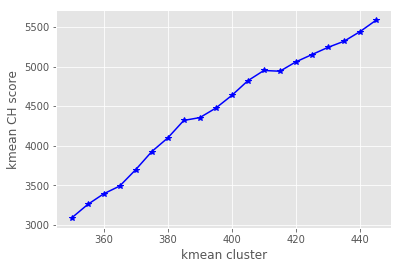

In [163]:

from sklearn.metrics import silhouette_score
K = range(350,450,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    kmeans = KMeans(n_clusters=k,max_iter=1000)
    kmeans.fit_predict(data)
    # 返回簇标签
    labels = kmeans.labels_
    score1=calinski_harabaz_score(data, labels)
    
    
    sc_score = silhouette_score(data, kmeans.labels_, metric='euclidean')
   

    centers = kmeans.cluster_centers_
    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(labels):
        SSE.append(np.sum((data.loc[labels == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, score, 'b*-')
plt.xlabel('kmean cluster')
plt.ylabel('kmean CH score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


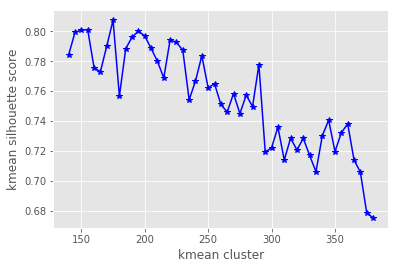

In [174]:

from sklearn.metrics import silhouette_score
K = range(140,385,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    kmeans = KMeans(n_clusters=k,max_iter=1000)
    kmeans.fit_predict(data)
    # 返回簇标签
    labels = kmeans.labels_
    score1=calinski_harabaz_score(data, labels)
    
    
    sc_score = silhouette_score(data, kmeans.labels_, metric='euclidean')
   

    centers = kmeans.cluster_centers_
    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(labels):
        SSE.append(np.sum((data.loc[labels == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')

plt.xlabel('kmean cluster')
plt.ylabel('kmean silhouette score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


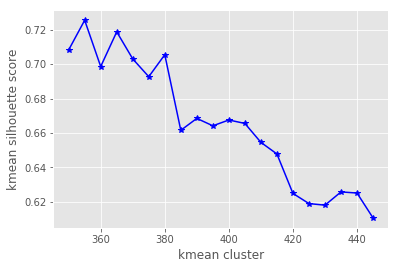

In [166]:
plt.plot(K, sc_scores, 'b*-')
plt.xlabel('kmean cluster')
plt.ylabel('kmean silhouette score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


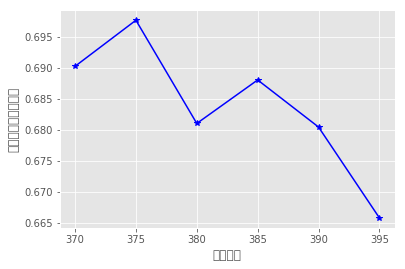

In [159]:

plt.plot(K, sc_scores, 'b*-')
plt.xlabel('簇的个数')
plt.ylabel('簇内离差平方和之和')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


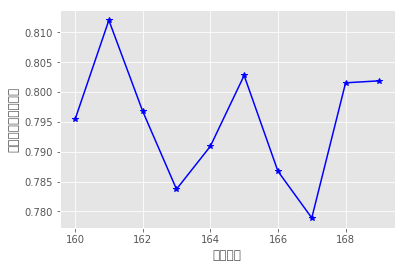

In [149]:

from sklearn.metrics import silhouette_score
K = range(160,170)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    kmeans = KMeans(n_clusters=k,max_iter=1000)
    kmeans.fit_predict(data)
    # 返回簇标签
    labels = kmeans.labels_
    score1=calinski_harabaz_score(data, labels)
    
    
    sc_score = silhouette_score(data, kmeans.labels_, metric='euclidean')
   

    centers = kmeans.cluster_centers_
    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(labels):
        SSE.append(np.sum((data.loc[labels == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')
plt.xlabel('簇的个数')
plt.ylabel('簇内离差平方和之和')
# 显示图形
plt.show()

In [ ]:

from sklearn.metrics import silhouette_score
K = range(160,170)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    kmeans = KMeans(n_clusters=k,max_iter=1000)
    kmeans.fit_predict(data)
    # 返回簇标签
    labels = kmeans.labels_
    score1=calinski_harabaz_score(data, labels)
    
    
    sc_score = silhouette_score(data, kmeans.labels_, metric='euclidean')
   

    centers = kmeans.cluster_centers_
    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(labels):
        SSE.append(np.sum((data.loc[labels == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')
plt.xlabel('簇的个数')
plt.ylabel('簇内离差平方和之和')
# 显示图形
plt.show()

1381.825282661704
Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


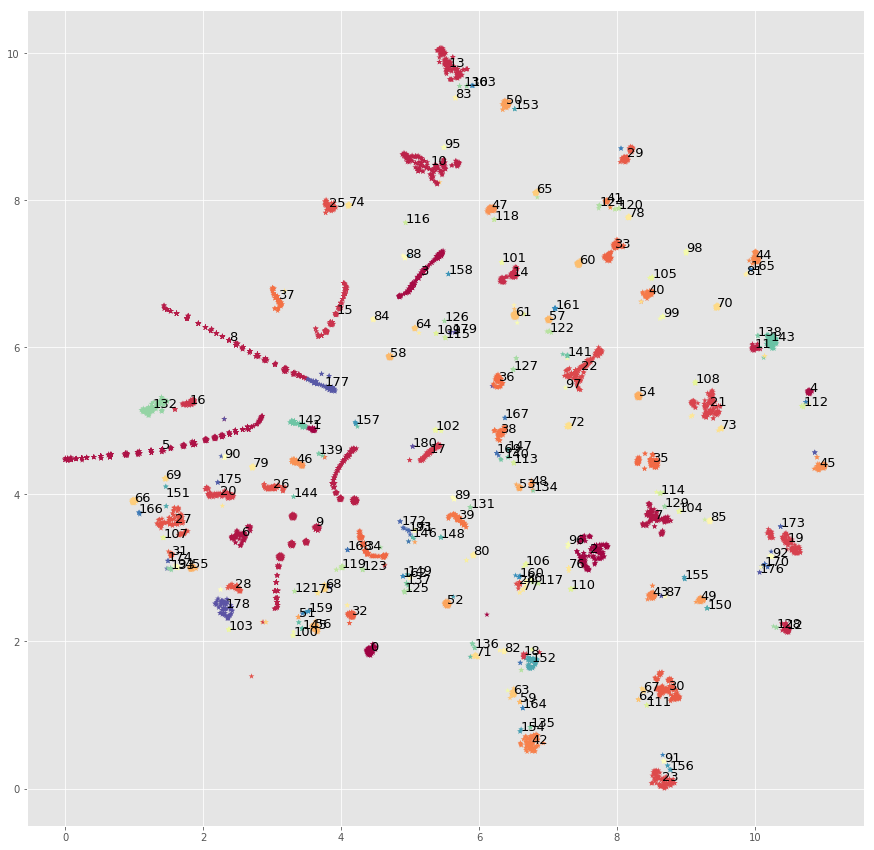

silhouette_score 0.7888262887535532
calinski_harabaz_score 1381.825282661704


In [156]:
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
clf = KMeans(n_clusters=181,max_iter=2000)
y_predict=clf.fit_predict(data)
cents = clf.cluster_centers_#质心
labels = clf.labels_#样本点被分配到的簇的索引


tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
plt.figure(figsize=(15, 15))
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) /30  # 归一化

plt.scatter(X_norm[:, 0], X_norm[:, 1], c=y_predict, cmap=plt.cm.Spectral, marker='*', linewidth=0)  

for index in range(181):
    i=np.where(y_predict == index)
    dot = X_norm[i,:]
    xtext, ytext = np.median(dot[0,] ,axis=0)    #中心点
    #plt.scatter(dot[:,:, 0], dot[:,:,1],  s=40, marker='.', linewidth=0)  
    plt.text(xtext, ytext, str(index),  fontsize=13)
plt.show()
print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))

3953.1495024161313
Org data dimension is  13  Embedded data dimension is {} 2


<Figure size 1080x1080 with 0 Axes>

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


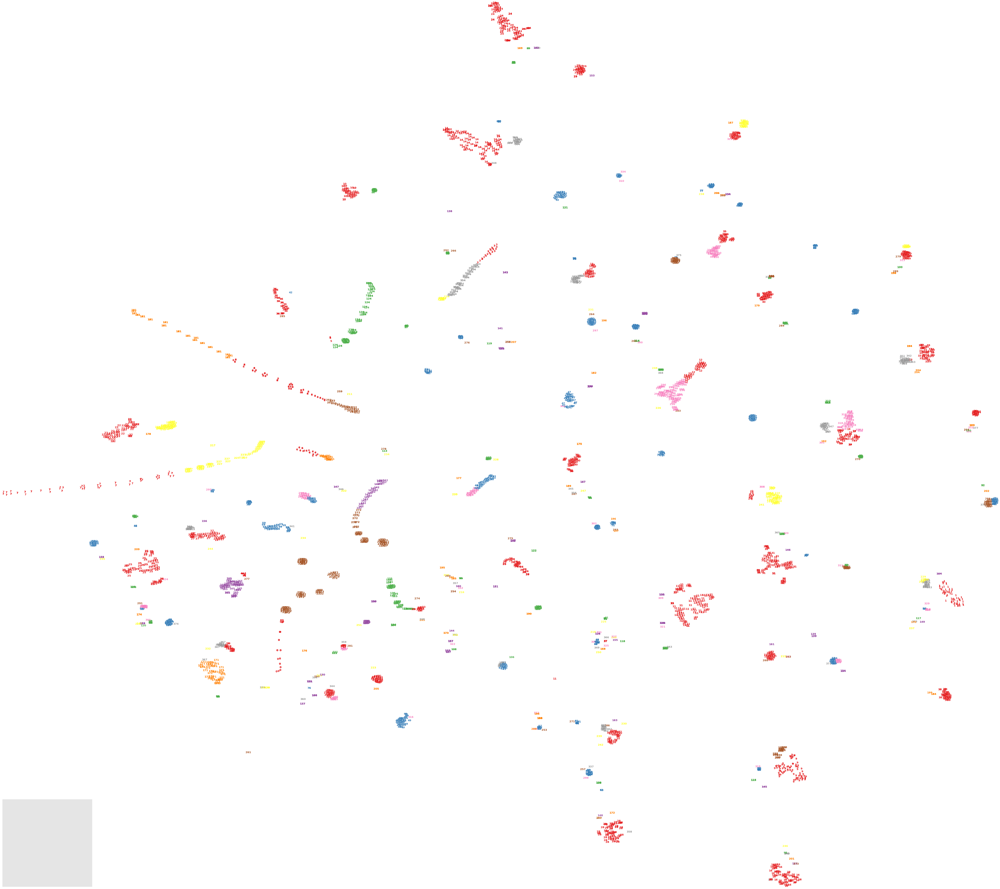

silhouette_score 0.7014112529708912
calinski_harabaz_score 3953.1495024161313


In [164]:
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
clf = KMeans(n_clusters=378,max_iter=1000)
y_predict=clf.fit_predict(data)
cents = clf.cluster_centers_#质心
labels = clf.labels_#样本点被分配到的簇的索引


tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
plt.figure(figsize=(15, 15))

x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / 30  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 378.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()

print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))

1279.431585713325
Org data dimension is  13  Embedded data dimension is {} 2


<Figure size 1080x1080 with 0 Axes>

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


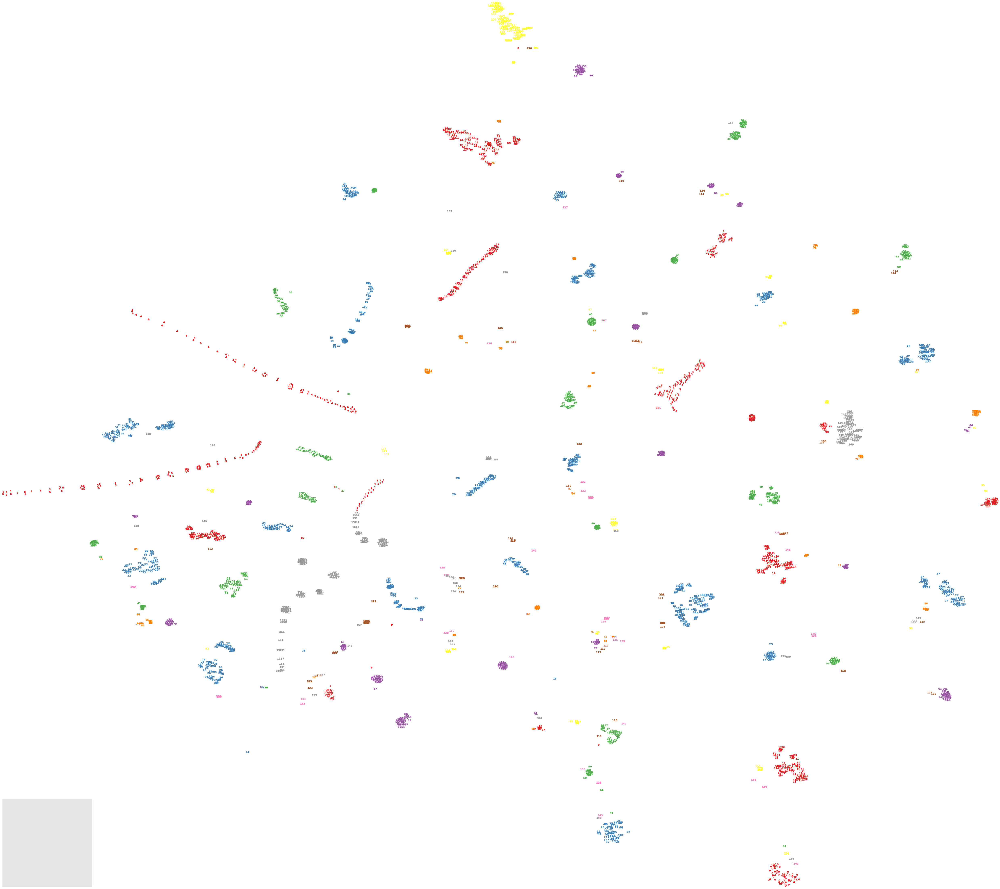

silhouette_score 0.7932094038629018
calinski_harabaz_score 1279.431585713325


In [165]:
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
clf = KMeans(n_clusters=161,max_iter=1000)
y_predict=clf.fit_predict(data)
cents = clf.cluster_centers_#质心
labels = clf.labels_#样本点被分配到的簇的索引


tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
plt.figure(figsize=(15, 15))

x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / 30  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 161.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()

print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))

1292.344484008848
Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


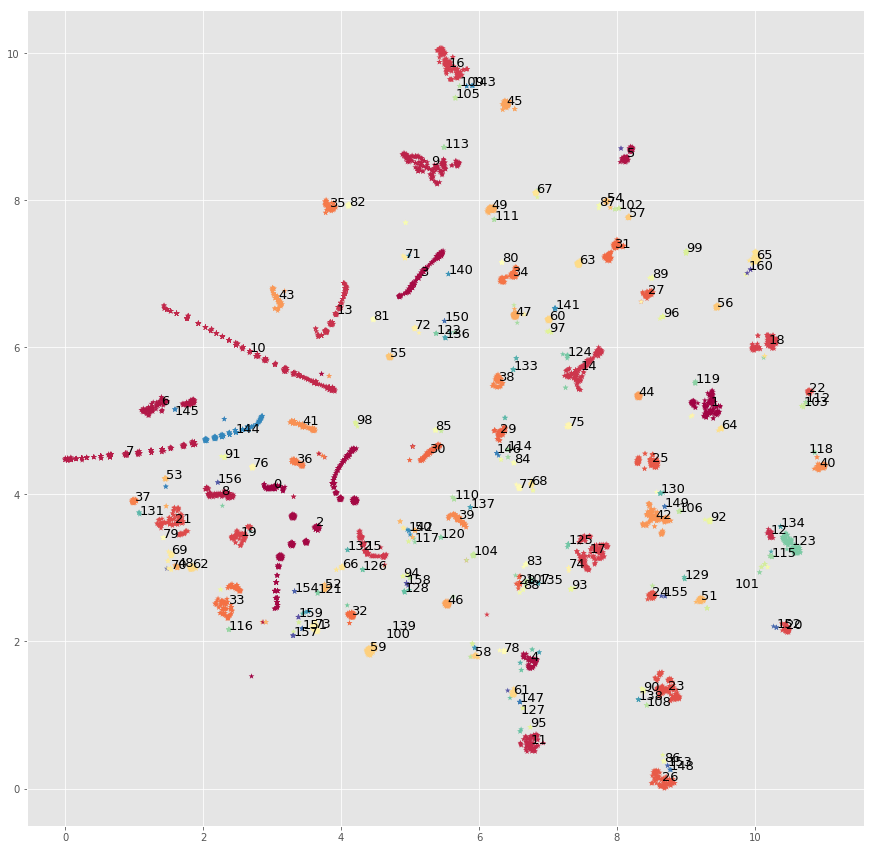

silhouette_score 0.7858534223561335
calinski_harabaz_score 1292.344484008848


In [158]:
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
clf = KMeans(n_clusters=161,max_iter=2000)
y_predict=clf.fit_predict(data)
cents = clf.cluster_centers_#质心
labels = clf.labels_#样本点被分配到的簇的索引


tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
plt.figure(figsize=(15, 15))
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) /30  # 归一化

plt.scatter(X_norm[:, 0], X_norm[:, 1], c=y_predict, cmap=plt.cm.Spectral, marker='*', linewidth=0)  

for index in range(161):
    i=np.where(y_predict == index)
    dot = X_norm[i,:]
    xtext, ytext = np.median(dot[0,] ,axis=0)    #中心点
    #plt.scatter(dot[:,:, 0], dot[:,:,1],  s=40, marker='.', linewidth=0)  
    plt.text(xtext, ytext, str(index),  fontsize=13)
plt.show()
print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


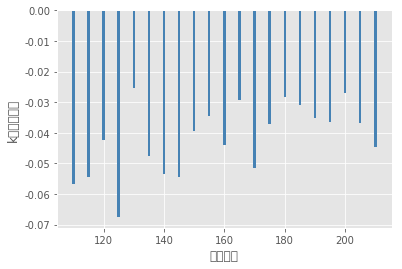

In [111]:
def short_pair_wise_D(each_cluster):
    mu = each_cluster.mean(axis = 0)
    Dk = sum(sum((each_cluster - mu)**2)) * 2.0 * each_cluster.shape[0]
    return Dk

# 计算簇内的Wk值
def compute_Wk(data, classfication_result):
    Wk = 0
    label_set = set(classfication_result)
    for label in label_set:
        each_cluster = data[classfication_result == label, :]
        Wk = Wk + short_pair_wise_D(each_cluster)/(2.0*each_cluster.shape[0])
    return Wk

# 计算GAP统计量 
def gap_statistic(X, B=10, K=range(110,220,5), N_init = 10):
    # 将输入数据集转换为数组
    X = np.array(X)
    # 生成B组参照数据
    shape = X.shape
    tops = X.max(axis=0)
    bots = X.min(axis=0)
    dists = np.matrix(np.diag(tops-bots))
    rands = np.random.random_sample(size=(B,shape[0],shape[1]))
    for i in range(B):
        rands[i,:,:] = rands[i,:,:]*dists+bots
    
    # 自定义0元素的数组，用于存储gaps、Wks和Wkbs
    gaps = np.zeros(len(K))
    Wks = np.zeros(len(K))
    Wkbs = np.zeros((len(K),B))
    # 循环不同的k值，
    for idxk, k in enumerate(K):
        k_means =  KMeans(n_clusters=k)
        k_means.fit(X)
        classfication_result = k_means.labels_
        # 将所有簇内的Wk存储起来
        Wks[idxk] = compute_Wk(X,classfication_result)
        
        # 通过循环，计算每一个参照数据集下的各簇Wk值
        for i in range(B):
            Xb = rands[i,:,:]
            k_means.fit(Xb)
            classfication_result_b = k_means.labels_
            Wkbs[idxk,i] = compute_Wk(Xb,classfication_result_b)

    # 计算gaps、sd_ks、sk和gapDiff
    gaps = (np.log(Wkbs)).mean(axis = 1) - np.log(Wks)        
    sd_ks = np.std(np.log(Wkbs), axis=1)
    sk = sd_ks*np.sqrt(1+1.0/B)
    # 用于判别最佳k的标准，当gapDiff首次为正时，对应的k即为目标值
    gapDiff = gaps[:-1] - gaps[1:] + sk[1:]
    
    # 中文和负号的正常显示
    plt.rcParams['font.sans-serif'] = [u'SimHei']
    plt.rcParams['axes.unicode_minus'] = False
    # 设置绘图风格
    plt.style.use('ggplot')
    # 绘制gapDiff的条形图
    plt.bar(np.arange(len(gapDiff))*5+110, gapDiff, color = 'steelblue')
    plt.xlabel('簇的个数')
    plt.ylabel('k的选择标准')
    plt.show()
    
# 自定义函数的调用（指定元素）
gap_statistic(data) 

4


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


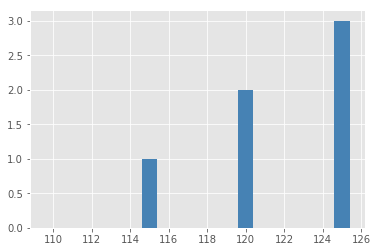

In [110]:
plt.bar(np.arange(110,130,5), [0,1,2,3], color = 'steelblue')
a=len(range(110,130,5))
print(a)

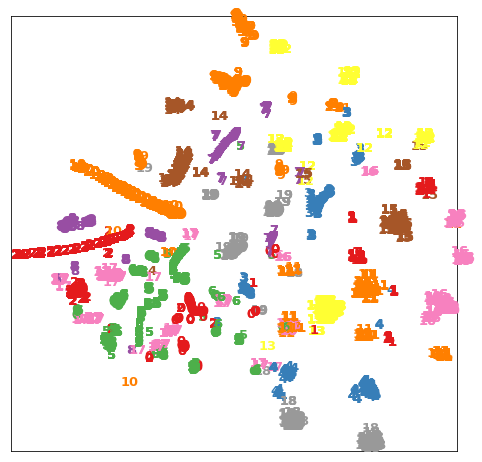

In [12]:
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 20.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()


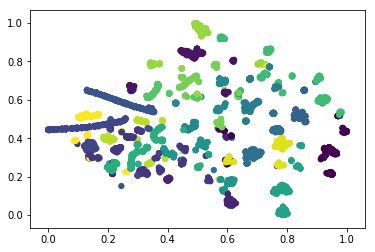

In [30]:
plt.scatter(X_norm[:,0], X_norm[:,1], lw=0, s=40,
                     c=y_predict)


In [109]:
tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)

print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])

'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=[plt.cm.Set1(y_predict[i]/13),plt.cm.Set2(y_predict[i]/13)], 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()


Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


ValueError: Invalid RGBA argument: ((0.6509803921568628, 0.33725490196078434, 0.1568627450980392, 1.0), (1.0, 0.8509803921568627, 0.1843137254901961, 1.0))

<Figure size 576x576 with 1 Axes>

Org data dimension is  13  Embedded data dimension is {} 2


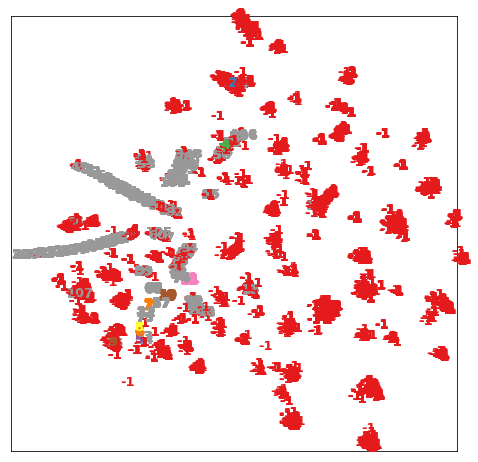

In [13]:
from sklearn.cluster import DBSCAN
import sklearn.cluster as skc
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
db =skc.DBSCAN(eps=0.01,min_samples=5).fit(data)
y_predict =db.labels_
tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)

print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])

'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/13), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()


In [ ]:
carat = [5, 10, 20, 30, 5, 10, 20, 30, 5, 10, 20, 30]
price = [100, 100, 200, 200, 300, 300, 400, 400, 500, 500, 600, 600]
color =['D', 'D', 'D', 'E', 'E', 'E', 'F', 'F', 'F', 'G', 'G', 'G',]

df = pd.DataFrame(dict(carat=carat, price=price, color=color))

fig, ax = plt.subplots()

colors = {'D':'red', 'E':'blue', 'F':'green', 'G':'black'}

ax.scatter(df['carat'], df['price'], c=df['color'].apply(lambda x: colors[x]))

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]


3675.1020629904583
Org data dimension is  13  Embedded data dimension is {} 2


<Figure size 1080x1080 with 0 Axes>

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


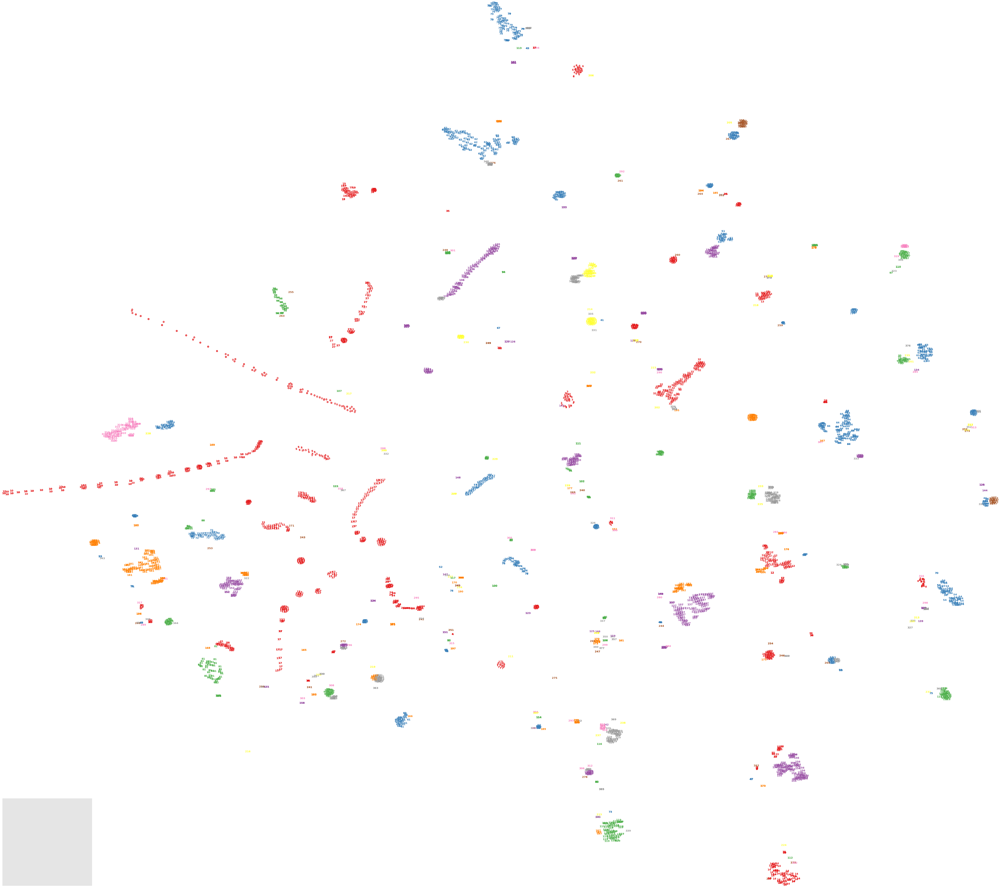

silhouette_score 0.7516890837315164
calinski_harabaz_score 3675.1020629904583


In [221]:
from sklearn.cluster import Birch 
import matplotlib.pyplot as plt

from sklearn.metrics import calinski_harabaz_score
y_predict = Birch(threshold=1,n_clusters=378).fit_predict(data)


tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
plt.figure(figsize=(15, 15))

x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / 30  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 360.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()

print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))


/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]


3354.959886584721
Org data dimension is  13  Embedded data dimension is {} 2


<Figure size 1080x1080 with 0 Axes>

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


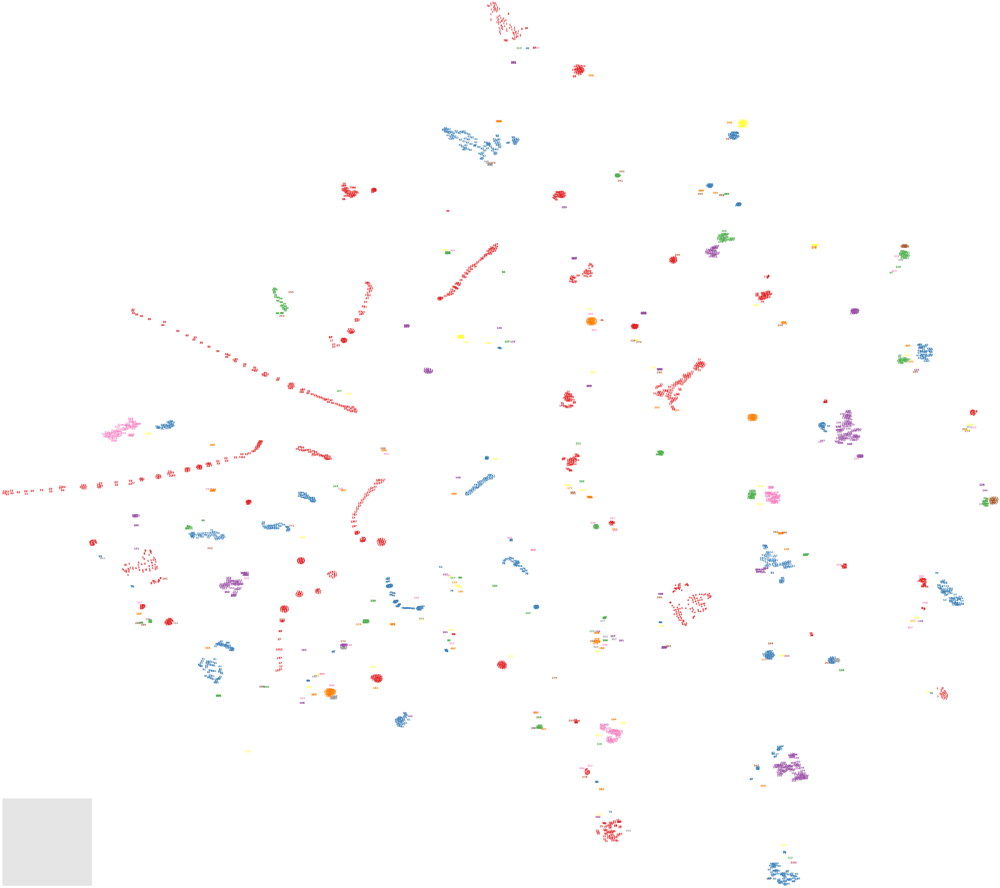

silhouette_score 0.7937412335791343
calinski_harabaz_score 3354.959886584721


In [222]:
y_predict = Birch(threshold=1,n_clusters=360).fit_predict(data)
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
plt.figure(figsize=(15, 15))

x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / 30  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 378.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()

print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))


/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]
/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


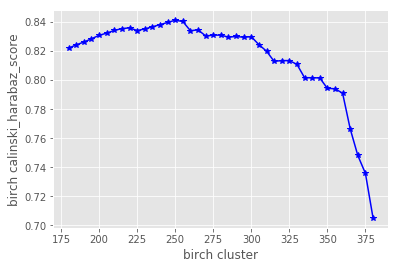

In [235]:

from sklearn.metrics import silhouette_score
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing

K = range(180,385,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
     
    bir= Birch(n_clusters=k).fit(data)
    y_predict=bir.predict(data)
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    
    
    sc_score = silhouette_score(data, y_predict, metric='euclidean')
   
    # 计算各簇样本的离差平方和，并保存到列表中
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')

plt.xlabel('birch cluster')
plt.ylabel('birch calinski_harabaz_score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]
/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


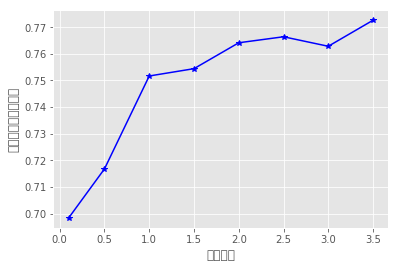

In [215]:

from sklearn.metrics import silhouette_score
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing

K = [0.1,0.5,1,1.5,2,2.5,3,3.5]
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
     
    bir= Birch(threshold=k,n_clusters=378).fit(data)
    y_predict=bir.predict(data)
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    
    
    sc_score = silhouette_score(data, y_predict, metric='euclidean')
   
    # 计算各簇样本的离差平方和，并保存到列表中
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')

plt.xlabel('簇的个数')
plt.ylabel('簇内离差平方和之和')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


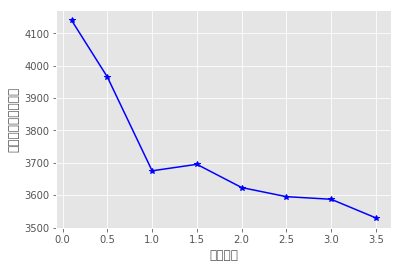

In [216]:
plt.plot(K, score, 'b*-')

plt.xlabel('簇的个数')
plt.ylabel('簇内离差平方和之和')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]
/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


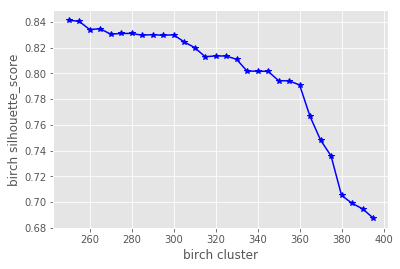

In [175]:

from sklearn.metrics import silhouette_score
BLE_RSSI = pd.read_csv('iBeacon_RSSI_UnLabeled.csv') #Labeled dataset
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing

K = range(250,400,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
     
    bir= Birch(n_clusters=k).fit(data)
    y_predict=bir.predict(data)
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    
    
    sc_score = silhouette_score(data, y_predict, metric='euclidean')
   
    # 计算各簇样本的离差平方和，并保存到列表中
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')

plt.xlabel('birch cluster')
plt.ylabel('birch silhouette_score')
# 显示图形
plt.show()

In [ ]:
plt.plot(K, score, 'b*-')

plt.xlabel('birch cluster')
plt.ylabel('calinski_harabaz_score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]
/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


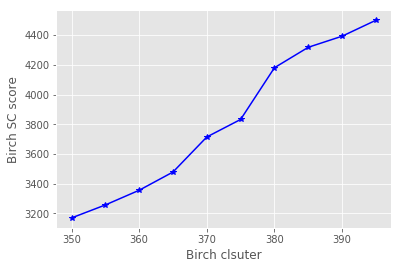

In [170]:

from sklearn.metrics import silhouette_score
K = range(350,400,5)
    # 构建空列表用于存储总的簇内离差平方和

score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    bir= Birch(n_clusters=k)
    y_predict=bir.fit_predict(data)
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    
    
    sc_score = silhouette_score(data, y_predict, metric='euclidean')
   
    # 计算各簇样本的离差平方和，并保存到列表中
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, score, 'b*-')
plt.xlabel('Birch clsuter')
plt.ylabel('Birch SC score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]
/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


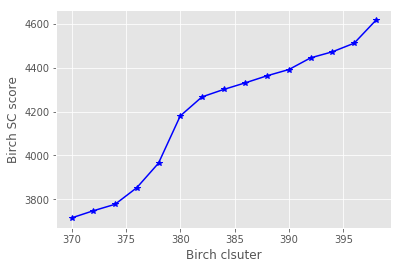

In [169]:

from sklearn.metrics import silhouette_score
K = range(370,400,2)
    # 构建空列表用于存储总的簇内离差平方和

score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    bir= Birch(n_clusters=k)
    y_predict=bir.fit_predict(data)
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    
    
    sc_score = silhouette_score(data, y_predict, metric='euclidean')
   
    # 计算各簇样本的离差平方和，并保存到列表中
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, score, 'b*-')
plt.xlabel('Birch clsuter')
plt.ylabel('Birch SC score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


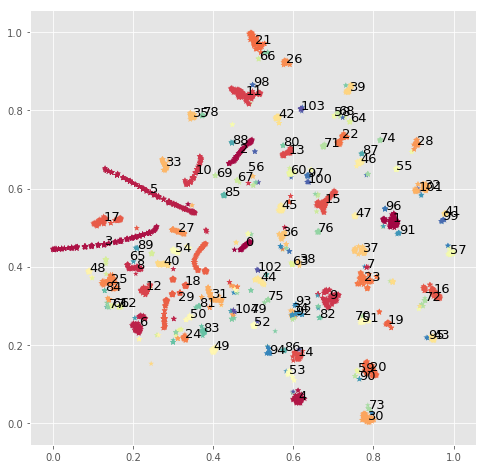

In [141]:
plt.figure(figsize=(8, 8))
plt.scatter(X_norm[:, 0], X_norm[:, 1], c=y_predict, cmap=plt.cm.Spectral, marker='*', linewidth=0)  
color=['r', 'b','g','r','orange']
for index in range(105):
    i=np.where(y_predict == index)
    dot = X_norm[i,:]
    xtext, ytext = np.median(dot[0,] ,axis=0)    #中心点
    #plt.scatter(dot[:,:, 0], dot[:,:,1],  s=40, marker='.', linewidth=0)  
    plt.text(xtext, ytext, str(index),  fontsize=13)


3922.6397630819674
Org data dimension is  13  Embedded data dimension is {} 2
silhouette_score 0.7081792576902293
calinski_harabaz_score 3922.6397630819674


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


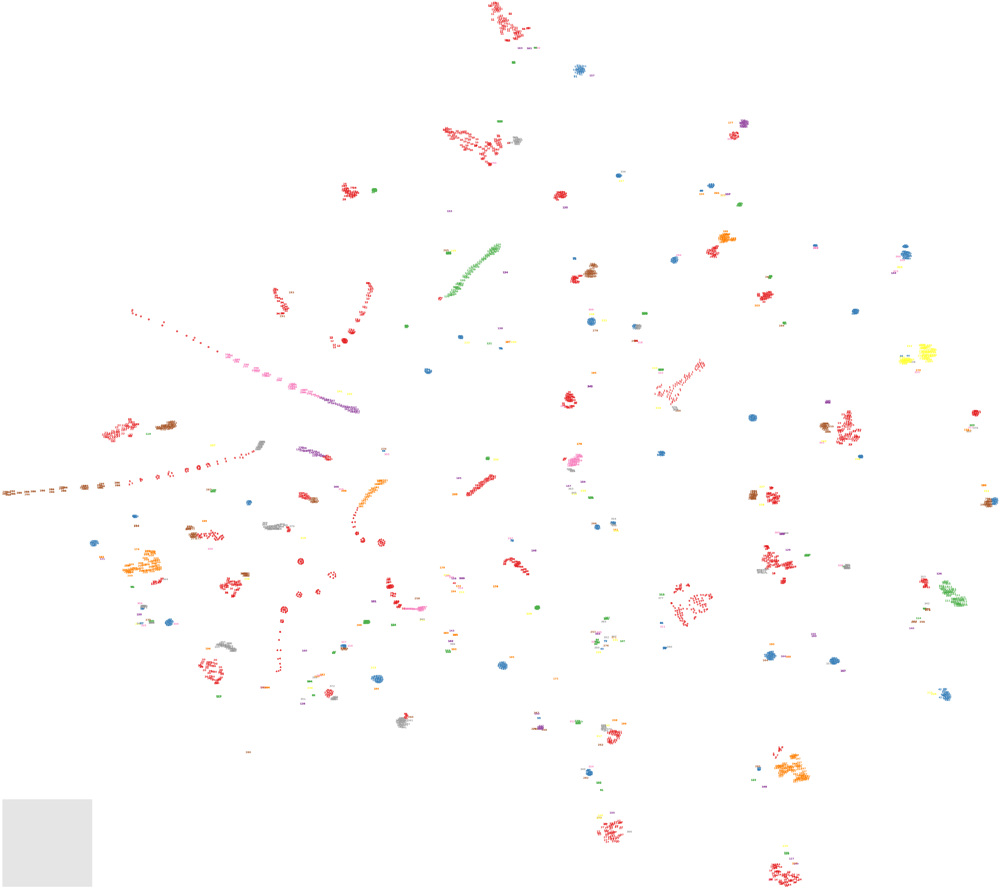

In [224]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=378).fit(data)
y_predict = gmm.predict(data)
tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / 30  # 归一化
print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 378.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()



3047.4524563974333
Org data dimension is  13  Embedded data dimension is {} 2
silhouette_score 0.709501760360175
calinski_harabaz_score 3047.4524563974333


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


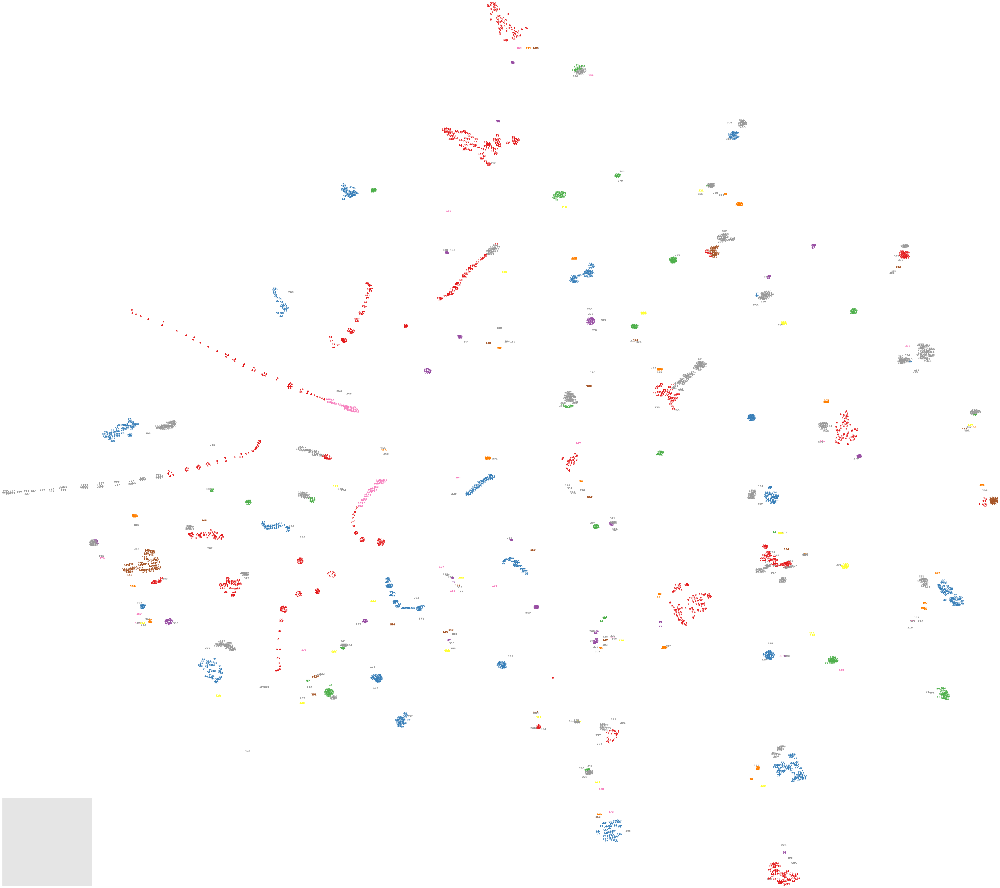

In [236]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=355).fit(data)
y_predict = gmm.predict(data)
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / 30  # 归一化
print("silhouette_score",silhouette_score(data, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data, y_predict))
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 200.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()



/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


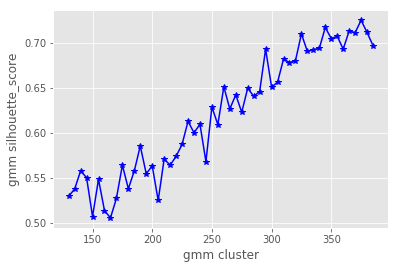

In [188]:
import numpy as np
from sklearn.metrics import silhouette_score
K = range(130,390,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    gmm = GaussianMixture(n_components=k).fit(data)
    y_predict = gmm.predict(data)
    centers=gmm.means_
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    
    
    sc_score = silhouette_score(data, y_predict, metric='euclidean')
   

    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(y_predict):
        SSE.append(np.sum((data.loc[y_predict == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')
plt.xlabel('gmm cluster')
plt.ylabel('gmm silhouette_score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


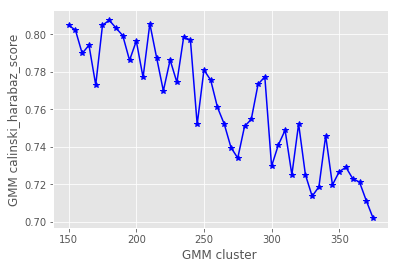

In [234]:
import numpy as np
from sklearn.metrics import silhouette_score
K = range(150,380,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    gmm = GaussianMixture(n_components=k).fit(data)
    y_predict = gmm.predict(data)
    centers=gmm.means_
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    
    
    sc_score = silhouette_score(data, y_predict, metric='euclidean')
   

    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(y_predict):
        SSE.append(np.sum((data.loc[y_predict == label,]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, sc_scores, 'b*-')
plt.xlabel('GMM cluster ')
plt.ylabel('GMM calinski_harabaz_score')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


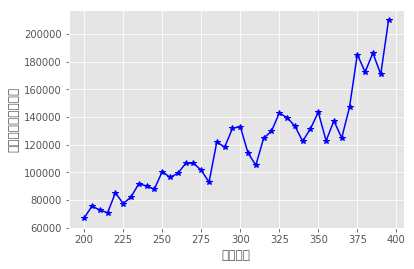

In [190]:
import numpy as np
from sklearn.metrics import silhouette_score
K = range(200,400,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
sc_scores=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    gmm = GaussianMixture(n_components=k).fit(data)
    y_predict = gmm.predict(data)
    centers=gmm.means_
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    

    score.append(score1)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, score, 'b*-')
plt.xlabel('簇的个数')
plt.ylabel('簇内离差平方和之和')
# 显示图形
plt.show()

/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


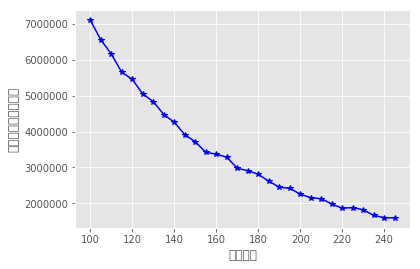

In [128]:

from sklearn.metrics import silhouette_score
K = range(100,250,5)
    # 构建空列表用于存储总的簇内离差平方和
TSSE = []
score=[]
for k in K:
    # 用于存储各个簇内离差平方和
    SSE = []
    gmm = GaussianMixture(n_components=k).fit(data)
    y_predict = gmm.predict(data)
    # 返回簇标签
    score1=calinski_harabaz_score(data, y_predict)
    centers = gmm.means_
  
    # 计算各簇样本的离差平方和，并保存到列表中
    for label in set(y_predict):
        SSE.append(np.sum((data.loc[label == y_predict]-centers[label,:])**2))
        # 计算总的簇内离差平方和 
    TSSE.append(np.sum(SSE))
    score.append(score1)
    sc_scores.append(sc_score)
# 中文和负号的正常显示
plt.rcParams['font.sans-serif'] = [u'SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 设置绘图风格
plt.style.use('ggplot')
# 绘制K的个数与GSSE的关系
plt.plot(K, TSSE, 'b*-')
plt.xlabel('簇的个数')
plt.ylabel('簇内离差平方和之和')
# 显示图形
plt.show()

嵌入空间可视化
355


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


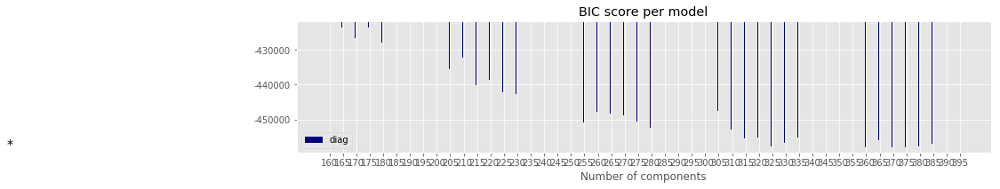

In [231]:
import numpy as np
import itertools

from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn import mixture

print(__doc__)

# Number of samples per component
n_samples = 500

# Generate random sample, two components
np.random.seed(0)
C = np.array([[0., -0.1], [1.7, .4]])

lowest_bic = np.infty
bic = []
n_components_range = range(160, 400,5)
cv_types = [ 'diag']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(data)
        bic.append(gmm.bic(data))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(14, 6))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)

y_predict = clf.predict(data)
cluster=len(set(y_predict))
print(len(set(y_predict)))

215
Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


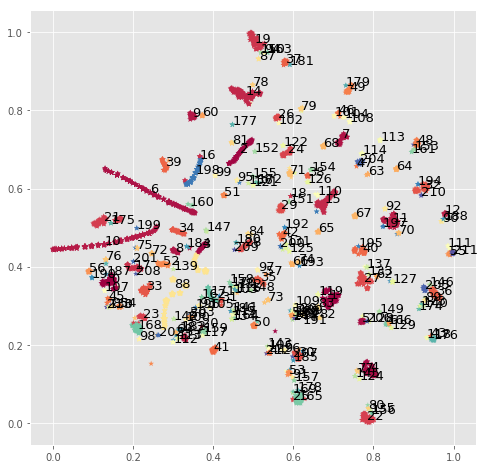

In [95]:

y_predict = clf.predict(data)
cluster=len(set(y_predict))
print(len(set(y_predict)))
tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)

print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])

'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
plt.figure(figsize=(8, 8))
plt.scatter(X_norm[:, 0], X_norm[:, 1], c=y_predict, cmap=plt.cm.Spectral, marker='*', linewidth=0)  
color=['r', 'b','g','r','orange']
for index in range(cluster):
    i=np.where(y_predict == index)
    dot = X_norm[i,:]
    xtext, ytext = np.median(dot[0,] ,axis=0)    #中心点
    #plt.scatter(dot[:,:, 0], dot[:,:,1],  s=40, marker='.', linewidth=0)  
    plt.text(xtext, ytext, str(index),  fontsize=13)


嵌入空间可视化


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


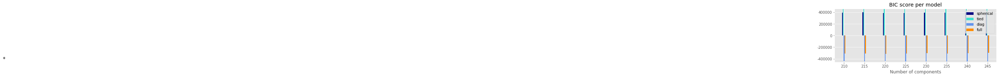

In [96]:
import numpy as np
import itertools

from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn import mixture

print(__doc__)

# Number of samples per component
n_samples = 500

# Generate random sample, two components
np.random.seed(0)
C = np.array([[0., -0.1], [1.7, .4]])

lowest_bic = np.infty
bic = []
n_components_range = range(210, 250,5)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(data)
        bic.append(gmm.bic(data))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(8, 6))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)


In [97]:
y_predict = clf.predict(data)
cluster=len(set(y_predict))
print(len(set(y_predict)))

230


Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


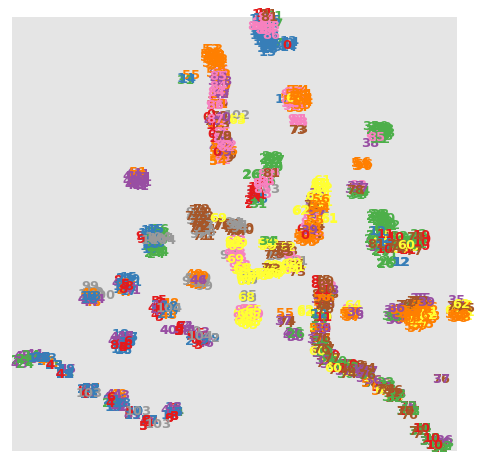

In [56]:
BLE_RSSI = pd.read_csv('iBeacon_RSSI_Labeled.csv') #Labeled dataset
locations = BLE_RSSI['location'][:] #The output variable, location, isolated from labled dataframe
data = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
from sklearn.preprocessing import OneHotEncoder
#Number the categories from 0 to 104
locations_encoded, locations_categories = pd.factorize(locations)

encoder = OneHotEncoder()
locations_1hot = encoder.fit_transform(locations_encoded.reshape(-1,1))
loactions=locations_1hot.toarray()
tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)

print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])

'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(locations_encoded[i]), color=plt.cm.Set1(locations_encoded[i]/105), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


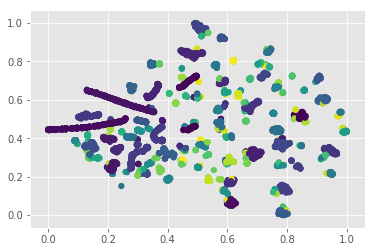

In [132]:
plt.scatter(X_norm[:,0], X_norm[:,1], lw=0, s=40,
                     c=y_predict)

In [240]:
import pandas as pd
#Loading of the labeled data
BLE_RSSI = pd.read_csv('iBeacon_RSSI_Labeled.csv') #Labeled dataset
locations = BLE_RSSI['location'][:] #The output variable, location, isolated from labled dataframe
means=BLE_RSSI.groupby(['location']).mean()

data2 = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing
count=BLE_RSSI['location'].value_counts()
np.where(count<5)
count


K04    34
J04    32
J06    29
I06    27
J07    27
I07    27
I08    26
K05    25
O04    24
Q05    24
O05    24
J03    24
S01    23
K03    23
K06    22
L06    22
J02    22
I02    21
S02    21
S05    20
L04    20
M06    20
S06    20
M04    19
J05    19
I03    19
I05    19
I01    18
Q04    18
I04    18
       ..
V15     8
U01     8
O02     8
J15     8
U05     8
I09     8
P15     7
T15     7
Q01     6
R06     6
L01     6
K01     6
D13     6
J10     6
T03     6
P02     6
U15     5
I15     5
E15     4
D14     4
Q02     4
S08     4
Q06     4
T01     4
G15     4
F08     4
L08     3
S15     3
O01     2
L09     2
Name: location, Length: 105, dtype: int64

991.7624957071129
Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


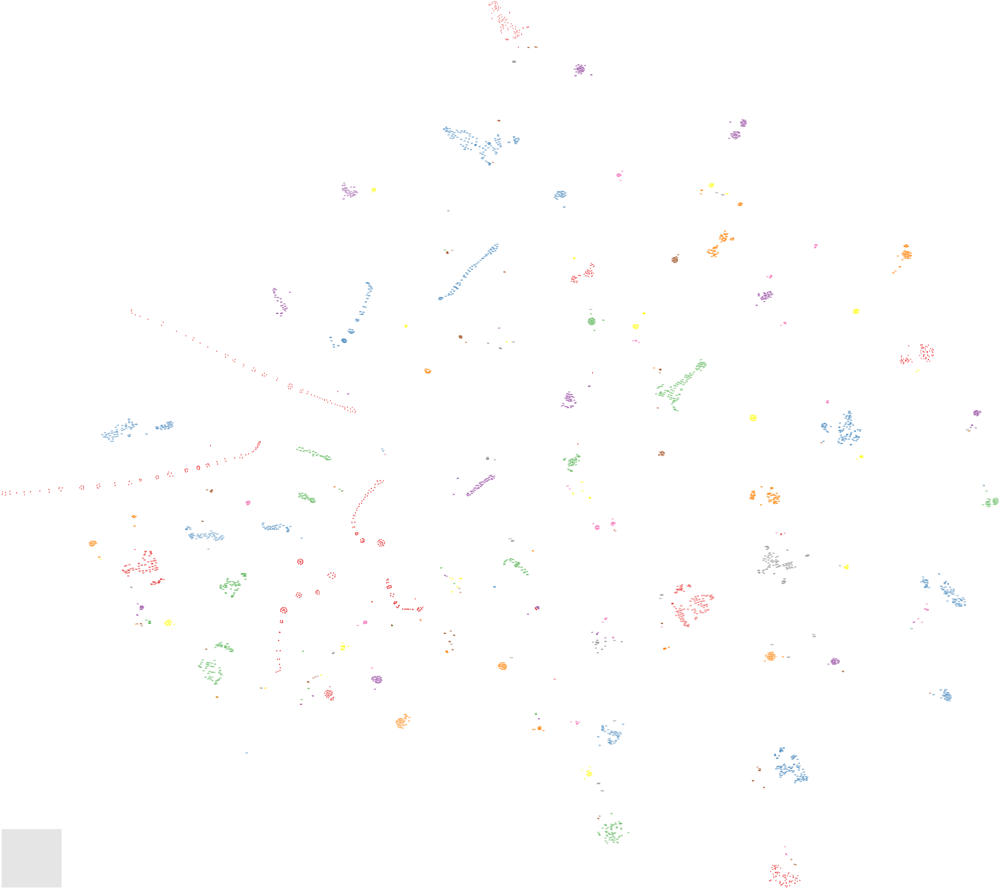

In [259]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import manifold
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
#Loading of the unlabeled data
clf = KMeans(n_clusters=105,max_iter=1000)
y_predict=clf.fit_predict(data)
cents = clf.cluster_centers_#质心
labels = clf.labels_#样本点被分配到的簇的索引


tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
from sklearn.metrics import calinski_harabaz_score

print(calinski_harabaz_score(data, y_predict))
print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / 20  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 105.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()


Org data dimension is  13  Embedded data dimension is {} 2


/Users/iris/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


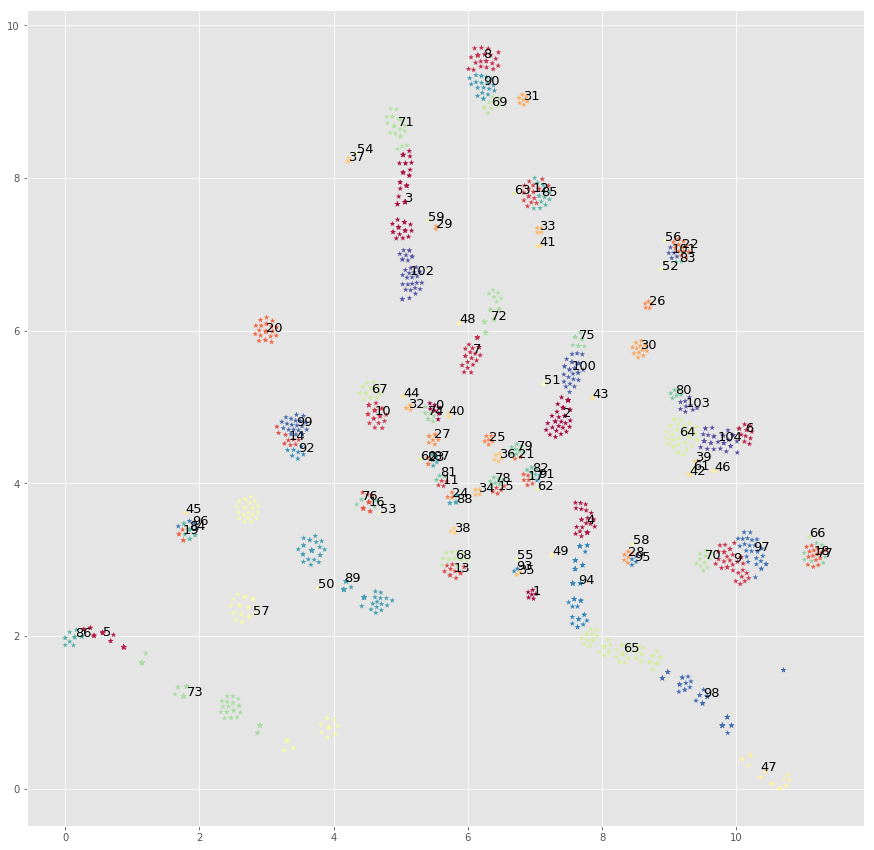

adjusted_mutual_info_score 0.3697467165150369
adjusted_rand_score 0.12780005154103266
silhouette_score 0.5748524120518606
calinski_harabaz_score 33244.6401436411
(0.5826751268803413, 0.6532958483578408, 0.6159679296011766)


In [137]:
 from sklearn import metrics
from sklearn.cluster import KMeans
BLE_RSSI = pd.read_csv('iBeacon_RSSI_Labeled.csv') #Labeled dataset
locations = BLE_RSSI['location'][:] #The output variable, location, isolated from labled dataframe

clf = KMeans(n_clusters=105,max_iter=1000)
y_predict=clf.fit_predict(data2)

tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data2)

print("Org data dimension is ",data.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])

'''嵌入空间可视化'''
plt.figure(figsize=(15, 15))
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) /30  # 归一化

plt.scatter(X_norm[:, 0], X_norm[:, 1], c=y_predict, cmap=plt.cm.Spectral, marker='*', linewidth=0)  

for index in range(105):
    i=np.where(y_predict == index)
    dot = X_norm[i,:]
    xtext, ytext = np.median(dot[0,] ,axis=0)    #中心点
    #plt.scatter(dot[:,:, 0], dot[:,:,1],  s=40, marker='.', linewidth=0)  
    plt.text(xtext, ytext, str(index),  fontsize=13)
plt.show()


print("adjusted_mutual_info_score",metrics.adjusted_mutual_info_score(locations, y_predict) )
print ("adjusted_rand_score",metrics.adjusted_rand_score(labels_true=locations, labels_pred=y_predict))
print("silhouette_score",silhouette_score(data2, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data2, y_predict))
print(metrics.homogeneity_completeness_v_measure(locations, y_predict))

(1420,)
adjusted_mutual_info_score 0.3719520533644336
adjusted_rand_score 0.1179341030771039
silhouette_score 0.5426585959393343
calinski_harabaz_score 24055.966446233175
bic: -99321.40231923855
(0.5742673354637939, 0.6663462352654748, 0.6168897165896636)
Org data dimension is  13  Embedded data dimension is {} 2


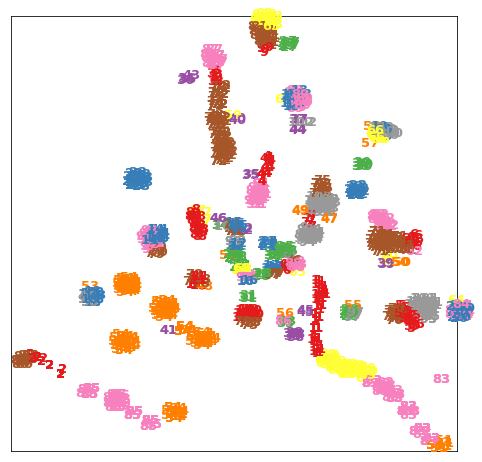

In [39]:
import pandas as pd
from sklearn.cluster import MeanShift, estimate_bandwidth 
from sklearn import metrics,manifold
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
BLE_RSSI = pd.read_csv('iBeacon_RSSI_Labeled.csv') #Labeled dataset
locations = BLE_RSSI['location'][:] #The output variable, location, isolated from labled dataframe

data2 = BLE_RSSI.drop(['date','location'], axis = 1)#64int iBeacon RSSI valued variables for data processing

 
gmm = GaussianMixture(n_components=105)
gmm.fit(data2)
y_predict=gmm.predict(data2)
print(y_predict.shape)
print("adjusted_mutual_info_score",metrics.adjusted_mutual_info_score(locations, y_predict) )
print ("adjusted_rand_score",metrics.adjusted_rand_score(labels_true=locations, labels_pred=y_predict))
print("silhouette_score",silhouette_score(data2, y_predict, metric='euclidean'))
print("calinski_harabaz_score",calinski_harabaz_score(data2, y_predict))
print("bic:",gmm.bic(data2))
print(metrics.homogeneity_completeness_v_measure(locations, y_predict))
tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data2)
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化


print("Org data dimension is ",data2.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])


'''嵌入空间可视化'''
x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max-x_min)  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 105.), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()



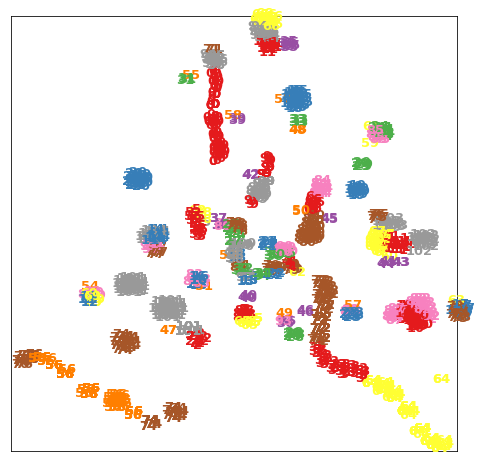

(0.5768124292090054, 0.667073386184403, 0.6186680732009279)


/Users/iris/anaconda3/lib/python3.7/site-packages/sklearn/cluster/birch.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  node1_dist, node2_dist = dist[[farthest_idx]]


calinski_harabaz_score 25953.516108923734
Org data dimension is  13  Embedded data dimension is {} 2
adjusted_mutual_info_score 0.3741788376706115
adjusted_rand_score 0.1112860668751081
silhouette_score 0.5536665621247373
(0.5676918903658241, 0.6786770669710941, 0.6182430408407625)


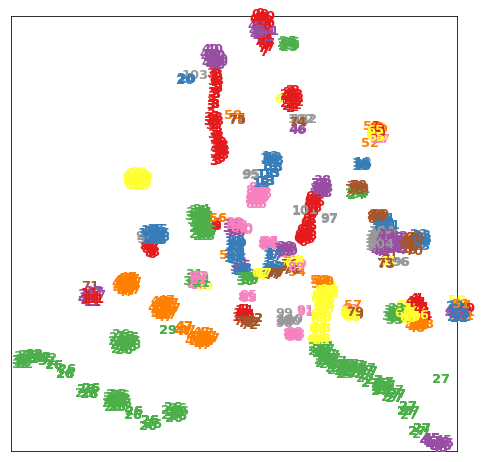

In [38]:
from sklearn.cluster import Birch 
import matplotlib.pyplot as plt

from sklearn.metrics import calinski_harabaz_score,silhouette_score
y_predict = Birch(n_clusters=105).fit_predict(data2)

print("calinski_harabaz_score",calinski_harabaz_score(data2, y_predict))
print("Org data dimension is ",data2.shape[-1],
     ' Embedded data dimension is {}', X_tsne.shape[-1])
print("adjusted_mutual_info_score",metrics.adjusted_mutual_info_score(locations, y_predict) )
print ("adjusted_rand_score",metrics.adjusted_rand_score(labels_true=locations, labels_pred=y_predict))
print("silhouette_score",silhouette_score(data2, y_predict, metric='euclidean'))
print(metrics.homogeneity_completeness_v_measure(locations, y_predict))
'''嵌入空间可视化'''
tsne = manifold.TSNE(n_components=2, init='pca', random_state=501)
X_tsne = tsne.fit_transform(data2)

x_min, x_max = X_tsne.min(0), X_tsne.max(0)
X_norm = (X_tsne - x_min) / (x_max - x_min)  # 归一化
plt.figure(figsize=(8, 8))
for i in range(X_norm.shape[0]):
    plt.text(X_norm[i, 0], X_norm[i, 1], str(y_predict[i]), color=plt.cm.Set1(y_predict[i]/ 105), 
             fontdict={'weight': 'bold', 'size': 13})
plt.xticks([])
plt.yticks([])
plt.show()
#calinski_harabaz_score 25953.516108923734
#adjusted_mutual_info_score 0.3741788376706115
#adjusted_rand_score 0.1112860668751081
#(0.5676918903658241, 0.6786770669710941, 0.6182430408407625)
 


In [73]:
print("silhouette_score",silhouette_score(data2, y_predict, metric='euclidean'))

silhouette_score 0.24320127671129793
